In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns  

from matplotlib.collections import LineCollection
import sklearn 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.cluster import DBSCAN, KMeans
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.manifold import TSNE
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import NearestNeighbors
import plotly.express as px

import plotly.express as px
import plotly.graph_objects as go
import pandas as pd


print('Sklearn               : ' + sklearn.__version__)

Sklearn               : 1.3.0


## notebook de test pour la segmentation client.

## Metriques d'évaluation:  
Il existe plusieurs mesures d'évaluation couramment utilisées pour évaluer la qualité des résultats de clustering. Celles que nous utiliserons sont:  

1. **Indice de Rand ajusté (ARI)** : Cette mesure compare les clusters obtenus avec les véritables étiquettes de classe. Un ARI de 1 indique que les clusters correspondent parfaitement aux véritables classes.

2. **Score de silhouette** : Cette mesure calcule la moyenne de la distance intra-cluster (a) et la distance du cluster le plus proche (b) pour chaque échantillon, puis calcule le score de silhouette comme (b - a) / max(a, b). Le score de silhouette varie de -1 à 1, où un score plus élevé indique que les échantillons sont bien appariés à leur propre cluster et mal appariés aux clusters voisins.

3. **Score de Davies-Bouldin** : Cette mesure est le ratio moyen de la distance intra-cluster à la distance inter-cluster. Un score de Davies-Bouldin plus faible indique un meilleur partitionnement.
## Algorithmes testés:
-Kmeans: Algorithme de clustering qui sépare un ensemble de données en différents groupes en fonction de leur similarité. L'objectif est de minimiser la distance entre les points dans un même cluster tout en maximisant la distance entre les différents clusters.  
-DBscan: Clustering basé sur la densité, permettant d'identifier des clusters dans des ensembles de données présentant des formes complexes, tout en ayant la capacité de détecter des points isolés considérés comme du bruit.
-clustering hierarchque: méthode de regroupement des données qui crée une hiérarchie de clusters, où les clusters sont regroupés en fonction de leur similarité.

## Features utilisées:
Dans un premier temps les tests des differents algo ce feront sur les données RFM (Recency,Frequency,Monetary).

Lorsque l'algo aura été validé d'autres features pourrons etres tester:"note", "product_category_name".
l'importance des nouvelles features pourrons etre observé grace a une ACP.

### Fonctions

In [2]:

df = pd.read_csv("Data/df_f.csv")
df.rename(columns={'product_category_name_english':'product_category'}, inplace=True)
df.drop(columns=['customer_city','order_purchase_timestamp','total_purchase_value'], inplace=True)
df = df.rename(columns={'customer_id': 'Frequency','last_purchase': 'Recency','achat_moy': 'Monetary'})

In [3]:
display(df.head())
df.info()

,customer_unique_id,Frequency,Monetary,note,payment_type,customer_state,Recency,product_category
0,0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,5.0,credit_card,SP,111.0,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,4.0,credit_card,SP,114.0,health_beauty
2,0000f46a3911fa3c0805444483337064,1,69.00,3.0,credit_card,SC,536.0,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,1,25.99,4.0,credit_card,PA,320.0,telephony
4,0004aac84e0df4da2b147fca70cf8255,1,180.00,5.0,credit_card,SP,287.0,telephony


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91459 entries, 0 to 91458
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  91459 non-null  object 
 1   Frequency           91459 non-null  int64  
 2   Monetary            91459 non-null  float64
 3   note                91459 non-null  float64
 4   payment_type        91459 non-null  object 
 5   customer_state      91459 non-null  object 
 6   Recency             91459 non-null  float64
 7   product_category    91459 non-null  object 
dtypes: float64(3), int64(1), object(4)
memory usage: 5.6+ MB


## Pipeline construction

In [4]:

# Définir customer_unique_id comme index
df.set_index('customer_unique_id', inplace=True)

# Supprimer les colonnes non désirées
X = df.drop(columns=['customer_state','payment_type', 'note', 'product_category'])

# Liste des colonnes
col_int = list(X.columns[X.dtypes == 'int64'])
col_float = list(X.columns[X.dtypes == 'float64'])
col_cate = list(X.columns[X.dtypes == 'object'])

# Pipelines de prétraitement
col_num_tr = Pipeline(steps=[
    ('scaler', StandardScaler())
])

col_cate_tr = Pipeline(steps=[
    ("encoder", OneHotEncoder(handle_unknown="ignore"))
])

# préprocesseur
preprocessor = ColumnTransformer(
    transformers=[
        ('numeric', col_num_tr, col_int + col_float),
        ('cat', col_cate_tr, col_cate)
    ], remainder='passthrough')

# Construction du pipeline kmeans complet
k_means_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('kmeans', KMeans(n_clusters=3, random_state=12))  # Changer le nombre de clusters au besoin
])

dbscan_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ( 'dbscan', DBSCAN())])

# afficheer les resultat du clustering (tableau)

def display_cluster_results(X, pipeline):
    """
    Display les resultat du clustering.

    Parametres:
    X (DataFrame): Les données d'entrée avec les features et les labels de cluster.
    pipeline (Pipeline): L'objet pipeline contenant le modèle de clustering.

    Retour:
    None
    """
    # Assignation des clusters aux données
    X['cluster'] = pipeline.named_steps['kmeans'].labels_
    
    # Calcul des métriques de silhouette et du coefficient de Davies-Bouldin
    silhouette = silhouette_score(X, X['cluster'])
    davies_bouldin = davies_bouldin_score(X, X['cluster'])
    
    # Affichage des résultats par cluster
    cluster_results = X.groupby('cluster').agg({
        'Frequency': 'mean',
        'Recency': 'mean',
        'Monetary': ['mean','count']
    }).round(2)

    print("Résultats par cluster :")
    display(cluster_results)
    
    print("\nCoefficient de silhouette :", silhouette)
    print("Coefficient de Davies-Bouldin :", davies_bouldin)

display(X.head())


,Frequency,Monetary,Recency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0
0000f46a3911fa3c0805444483337064,1,69.00,536.0
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0


# Segmentation avec les features RFM et selection de l'algorithme

## Kmeans sur les features RFM

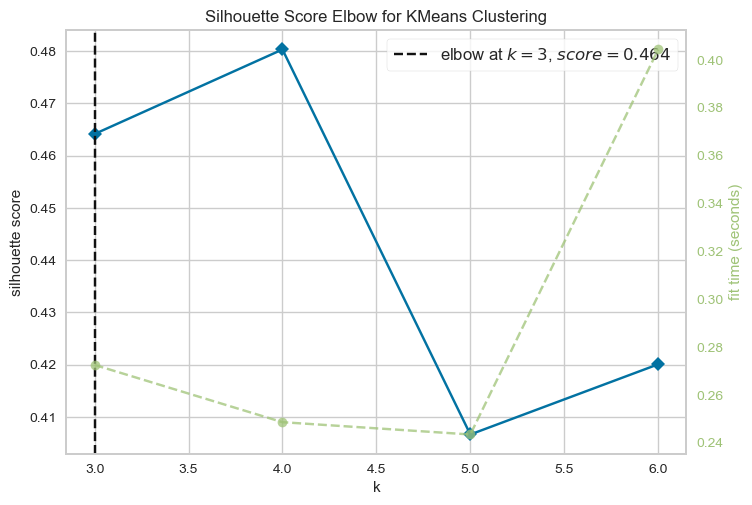

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [5]:
# Determiner le nombre de Cluster optimal

model = KMeans(init='k-means++', random_state=1 , n_init=10)
visualizer = KElbowVisualizer(model, 
                              k=(3,7),
                              metric='silhouette', 
                              timings=True)

visualizer.fit(X)
visualizer.poof()


pour determiner le nombre de Cluster nous utilisons le silouhette_score.  
le coude du graphique c'est a dire le point ou l'augmentation du score de silhouette commence a ralentire ce situe a k =4 avec un score de 0.45

In [6]:

'''i = 4
while i <= 5:     
    model = KMeans(n_clusters=i, init='k-means++', n_init=10)
    visualizer = SilhouetteVisualizer(model)

    visualizer.fit(X)    
    visualizer.poof()    
    i += 1
'''

"i = 4\nwhile i <= 5:     \n    model = KMeans(n_clusters=i, init='k-means++', n_init=10)\n    visualizer = SilhouetteVisualizer(model)\n\n    visualizer.fit(X)    \n    visualizer.poof()    \n    i += 1\n"

In [7]:
def create_3d_scatter_plot(X ,end_title=str):
    """
    Creation d'un graphique en 3D basé sur les données fournies.

    Parameters:
    X (DataFrame): les données à tracer.
    end_title (str): Le suffixe du titre pour le graphique.
   
    """
    
    # Create a 3D scatter plot
    fig = px.scatter_3d(X, x='Frequency', y='Recency', z='Monetary', color='cluster')

    # Customize the plot
    fig.update_layout(
        title='Customer Segmentation' + end_title, 
        scene=dict(
            xaxis=dict(title='Frequency'),
            yaxis=dict(title='Recency'),
            zaxis=dict(title='Monetary'),
        ),
        width=800,  
        height=600  
    )
    fig.update_traces(marker=dict(size=3))

    # Afficher le plot
    fig.show()


In [8]:

def scatter_tsne(X_tsne, end_title=str):
    """
    Visualisation des données en utilisant t-SNE.
    X_tsne (array): les données à visualiser.
    end_title (str): Le suffixe du titre pour le graphique.
    """
    
    plt.figure(figsize=(7, 6))
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=k_means_pipeline.named_steps['kmeans'].labels_,cmap='viridis',s=6)
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.title('t-SNE Visualization'+ end_title)
    plt.show()

## Kmeans sur les features RFM 

### Essais avec 4 clusters

Résultats par cluster :


Frequency Recency Monetary       
             mean    mean     mean  count
cluster                                  
0            1.11  126.93   102.75  49221
1            1.12  386.87   102.70  36097
2            1.08  240.28   979.95   2471
3            4.16  247.49    83.89   3670


Coefficient de silhouette : 0.2682138013312619
Coefficient de Davies-Bouldin : 1.6081947092492823


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91459 samples in 0.046s...
[t-SNE] Computed neighbors for 91459 samples in 0.804s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91459
[t-SNE] Computed conditional probabilities for sample 2000 / 91459
[t-SNE] Computed conditional probabilities for sample 3000 / 91459
[t-SNE] Computed conditional probabilities for sample 4000 / 91459
[t-SNE] Computed conditional probabilities for sample 5000 / 91459
[t-SNE] Computed conditional probabilities for sample 6000 / 91459
[t-SNE] Computed conditional probabilities for sample 7000 / 91459
[t-SNE] Computed conditional probabilities for sample 8000 / 91459
[t-SNE] Computed conditional probabilities for sample 9000 / 91459
[t-SNE] Computed conditional probabilities for sample 10000 / 91459
[t-SNE] Computed conditional probabilities for sample 11000 / 91459
[t-SNE] Computed conditional probabilities for sample 12000 / 91459
[t-SNE] Computed conditional probabilities for sam

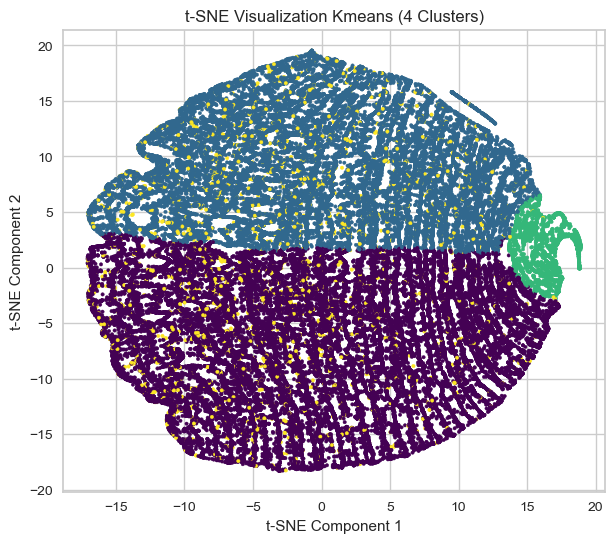

In [9]:

k4_rfm = X.copy()
k_means_pipeline.named_steps['kmeans'].set_params(init ='k-means++', n_clusters=4, random_state=1 , n_init=10)
k_means_pipeline.fit_transform(k4_rfm)
display_cluster_results(k4_rfm, k_means_pipeline)
create_3d_scatter_plot(k4_rfm, ' Kmeans (4 Clusters)') 

tsne = TSNE(n_components=2,init='pca',n_iter=300, n_jobs=-1, verbose=1)
X_tsne = tsne.fit_transform(k4_rfm)

# Visualisation t-SNE
scatter_tsne(X_tsne, ' Kmeans (4 Clusters)')

k4_rfm.to_csv('final_cluster/k4_rfm.csv', index=True)



In [10]:

# Visualisation des clusters
r = k_means_pipeline.named_steps['kmeans'].cluster_centers_
categories = k4_rfm.columns[:-1]
display(r, categories)

def plot_clusters(r, categories):
    """
    Plot les clusters en utilisant un graphique radar.

    Parametres:
    r (array): Les données des clusters.
    categories (array): Les noms des catégories.

    Retour:
    None
    """
    fig = go.Figure()

    for i in range(len(r)):
        fig.add_trace(go.Scatterpolar(
            r=r[i],
            theta=categories,
            fill='toself',
            name=f'Cluster {i}'
        ))

    fig.show()
plot_clusters(r, categories)



array([[-0.15064527, -0.12140601, -0.72340108],
       [-0.13426113, -0.12176668,  0.97846659],
       [-0.18108725,  4.52992713,  0.01923673],
       [ 3.46385241, -0.22155581,  0.06535545]])

Index(['Frequency', 'Monetary', 'Recency'], dtype='object')

### Essai avec 5 clusters

,Frequency,Monetary,Recency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0
0000f46a3911fa3c0805444483337064,1,69.00,536.0
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0


Résultats par cluster :


Frequency Recency Monetary       
             mean    mean     mean  count
cluster                                  
0            1.11  126.46   102.76  49047
1            1.12  386.15   102.71  36257
2            1.08  240.44   980.76   2466
3            3.85  248.09    83.97   3583
4           14.48  275.71    96.22    106


Coefficient de silhouette : 0.263340377392617
Coefficient de Davies-Bouldin : 4.712749757764337


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91459 samples in 0.046s...
[t-SNE] Computed neighbors for 91459 samples in 0.811s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91459
[t-SNE] Computed conditional probabilities for sample 2000 / 91459
[t-SNE] Computed conditional probabilities for sample 3000 / 91459
[t-SNE] Computed conditional probabilities for sample 4000 / 91459
[t-SNE] Computed conditional probabilities for sample 5000 / 91459
[t-SNE] Computed conditional probabilities for sample 6000 / 91459
[t-SNE] Computed conditional probabilities for sample 7000 / 91459
[t-SNE] Computed conditional probabilities for sample 8000 / 91459
[t-SNE] Computed conditional probabilities for sample 9000 / 91459
[t-SNE] Computed conditional probabilities for sample 10000 / 91459
[t-SNE] Computed conditional probabilities for sample 11000 / 91459
[t-SNE] Computed conditional probabilities for sample 12000 / 91459
[t-SNE] Computed conditional probabilities for sam

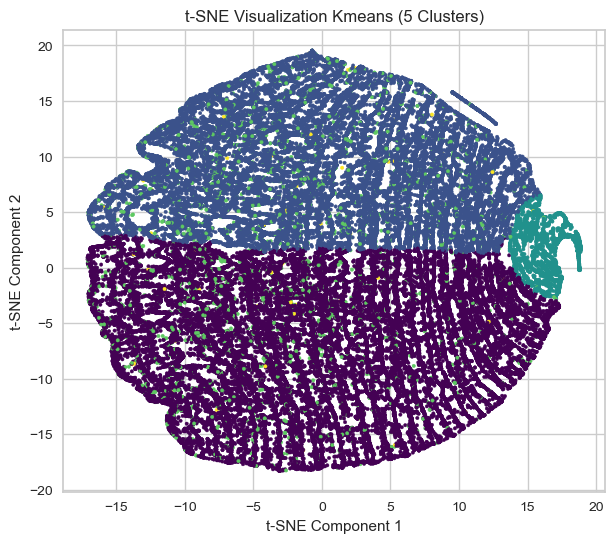

In [11]:

k5_rfm = X.copy()
k_means_pipeline.named_steps['kmeans'].set_params(init = 'k-means++',n_clusters=5)
k_means_pipeline.fit_transform(k5_rfm)
display(k5_rfm.head())
display_cluster_results(k5_rfm, k_means_pipeline)
create_3d_scatter_plot(k5_rfm,' (5 Clusters)')
# T-SNE
tsne = TSNE(n_components=2, init='pca',n_iter=300, n_jobs=-1, verbose=1)
X_tsne = tsne.fit_transform(k5_rfm)

# Visualize the results
scatter_tsne(X_tsne, ' Kmeans (5 Clusters)')



## Dendogramme avec les features RFM

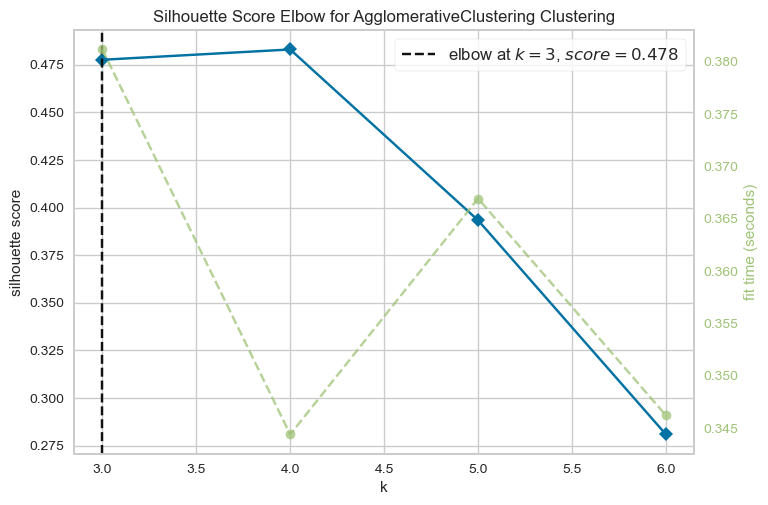

<Axes: title={'center': 'Silhouette Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='silhouette score'>

In [12]:
rfm_reduced = X.iloc[:5000]
clustering = AgglomerativeClustering()
visualizer = KElbowVisualizer(clustering, 
                              k=(3,7),
                              metric='silhouette', 
                              timings=True)

visualizer.fit(rfm_reduced)
visualizer.poof()


In [13]:
#def plot_dendrogram(model, **kwargs):
'''
    Return the dendogram of a dataset
    
        Parameters: 
            model: model for the linkage matrix
            **kwargs: parameters for the model
            
        Returns:
            plot of the dengogram
            


    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

# I select my data
rfm_reduced = X.iloc[:10000,:]

model = model.fit(rfm_reduced)
plt.figure(figsize=(8,8))
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=4)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.xticks(rotation=45)
plt.show()'''

'\n    Return the dendogram of a dataset\n    \n        Parameters: \n            model: model for the linkage matrix\n            **kwargs: parameters for the model\n            \n        Returns:\n            plot of the dengogram\n            \n\n\n    # create the counts of samples under each node\n    counts = np.zeros(model.children_.shape[0])\n    n_samples = len(model.labels_)\n    for i, merge in enumerate(model.children_):\n        current_count = 0\n        for child_idx in merge:\n            if child_idx < n_samples:\n                current_count += 1  # leaf node\n            else:\n                current_count += counts[child_idx - n_samples]\n        counts[i] = current_count\n\n    linkage_matrix = np.column_stack([model.children_, model.distances_,\n                                      counts]).astype(float)\n\n    # Plot the corresponding dendrogram\n    dendrogram(linkage_matrix, **kwargs)\n# setting distance_threshold=0 ensures we compute the full tree.\nmodel =

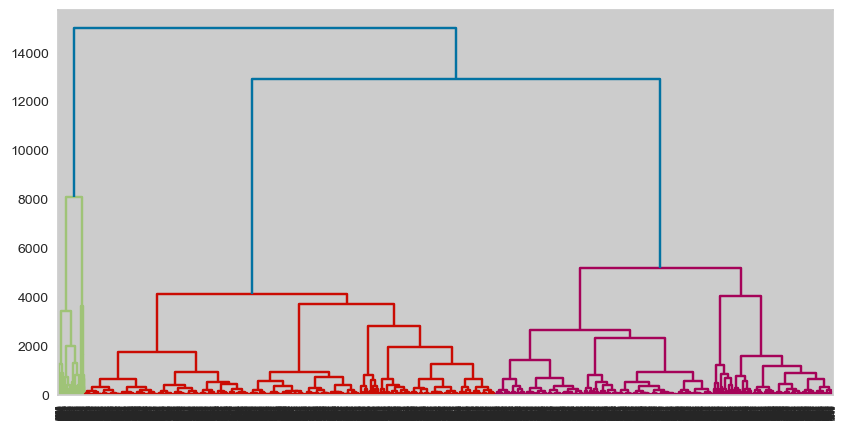

Silhouette score: 0.4829695114312988
Davies-Bouldin index: 0.6618199309197494


In [14]:
import scipy.cluster.hierarchy as sch

# Créer l'objet AgglomerativeClustering
model = AgglomerativeClustering(distance_threshold=None, n_clusters=4, linkage='ward')

# Ajuster le modèle sur les données
model = model.fit(rfm_reduced)

# Couper l'arbre à un niveau donné
clusters = model.fit_predict(rfm_reduced) # à modifier en fonction de votre niveau de coupure
# Créer la matrice de liaison (linkage matrix) à partir du modèle
linkage_matrix = sch.linkage(rfm_reduced, method='ward')

# Tracer le dendrogramme
fig = plt.figure(figsize=(10, 5))
dn = sch.dendrogram(linkage_matrix)

# Afficher le graphique
plt.show()
# Calculer la métrique Silhouette
silhouette_avg = silhouette_score(rfm_reduced, clusters)
print('Silhouette score:', silhouette_avg)


# Calculer la métrique Davies-Bouldin
davies_bouldin_avg = davies_bouldin_score(rfm_reduced, model.labels_)
print('Davies-Bouldin index:', davies_bouldin_avg)



Bien que le clustering hiérarchique agglomératif puisse fournir des informations précieuses sur la structure des données, les contraintes de performance en termes de temps d'exécution le rendent moins adapté à notre cas d'utilisation. L'analyse de grands ensembles de données, comme celui que nous avons, nécessite des algorithmes plus efficaces, ce qui nous pousse à explorer d'autres méthodes de clustering.  
sample de taille 40000 = 81min de traitement 

## Test DBscan sur les features RFM

### Determiner la valeur de epsilon

(91459, 3)


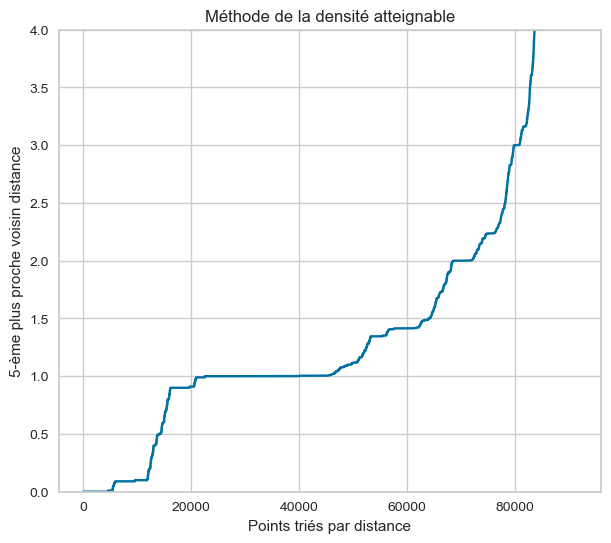

In [15]:
DBscan_rfm = X.copy()
print(DBscan_rfm.shape)
dbscan_pipeline.named_steps['preprocessor'].fit_transform(DBscan_rfm)
# Calculer la distance entre chaque point et son k-ème plus proche voisin
k=5
nbrs = NearestNeighbors(n_neighbors=5).fit(DBscan_rfm)
distances, _ = nbrs.kneighbors(DBscan_rfm)
distances = np.sort(distances[:, -1])

# Afficher le graphique de la distance entre chaque point et son k-ème plus proche voisin
plt.figure(figsize=(7, 6))
plt.plot(distances)
plt.title("Méthode de la densité atteignable")
plt.xlabel("Points triés par distance")
plt.ylabel(f"{k}-ème plus proche voisin distance")
plt.grid(True)
plt.ylim(0, 4)
plt.show()



In [16]:
# Calcule des meilleur parametres pour DBSCAN
'''from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Définir les gammes de paramètres à tester
eps_range = [0.5,0.8]
min_samples_range = [40,50]

# Initialiser les variables pour stocker les meilleurs paramètres et score
best_eps = best_min_samples = 0
best_score = -1

for eps in eps_range:
    for min_samples in min_samples_range:
        # Appliquer DBSCAN avec les paramètres actuels
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        clusters = dbscan.fit_predict(DBscan_rfm)
        
        # Vérifier s'il y a plus d'un cluster identifié
        if len(set(clusters)) > 1:
            # Calculer le score de silhouette
            silhouette = silhouette_score(DBscan_rfm, clusters)
            
            # Si le score de silhouette est meilleur que le meilleur score actuel, mettre à jour les meilleurs paramètres
            if silhouette > best_score:
                best_eps, best_min_samples, best_score = eps, min_samples, silhouette

print("Meilleurs paramètres : eps =", best_eps, ", min_samples =", best_min_samples)
print("Meilleur score de silhouette :", best_score)'''

'from sklearn.cluster import DBSCAN\nfrom sklearn.metrics import silhouette_score\n\n# Définir les gammes de paramètres à tester\neps_range = [0.5,0.8]\nmin_samples_range = [40,50]\n\n# Initialiser les variables pour stocker les meilleurs paramètres et score\nbest_eps = best_min_samples = 0\nbest_score = -1\n\nfor eps in eps_range:\n    for min_samples in min_samples_range:\n        # Appliquer DBSCAN avec les paramètres actuels\n        dbscan = DBSCAN(eps=eps, min_samples=min_samples)\n        clusters = dbscan.fit_predict(DBscan_rfm)\n        \n        # Vérifier s\'il y a plus d\'un cluster identifié\n        if len(set(clusters)) > 1:\n            # Calculer le score de silhouette\n            silhouette = silhouette_score(DBscan_rfm, clusters)\n            \n            # Si le score de silhouette est meilleur que le meilleur score actuel, mettre à jour les meilleurs paramètres\n            if silhouette > best_score:\n                best_eps, best_min_samples, best_score = eps,

In [17]:
DBscan_rfm = X.copy()
dbscan_pipeline.named_steps['dbscan'].set_params(eps=1, min_samples=50)
dbscan_pipeline.fit(DBscan_rfm)


#display_cluster_results(DBscan_rfm, dbscan_pipeline)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Frequency', 'Monetary',
                                                   'Recency']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  [])])),
                ('dbscan', DBSCAN(eps=1, min_samples=50))])

Résultats par cluster : 
         Frequency Recency Monetary       
             mean    mean     mean  count
cluster                                  
-1           6.53  277.43   937.34    455
 0           1.00  235.64   127.07  77619
 1           2.00  245.47    93.26   9950
 2           4.00  266.02    79.02    916
 3           3.00  243.18    83.26   1920
 4           5.00  244.76    79.27    323
 5           6.00  239.30    65.42    276

Coefficient de silhouette : -0.1330300147149712
Coefficient de Davies-Bouldin : 27.050070927249056
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91459 samples in 0.051s...
[t-SNE] Computed neighbors for 91459 samples in 1.370s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91459
[t-SNE] Computed conditional probabilities for sample 2000 / 91459
[t-SNE] Computed conditional probabilities for sample 3000 / 91459
[t-SNE] Computed conditional probabilities for sample 4000 / 91459
[t-SNE] Computed conditional probabilities 

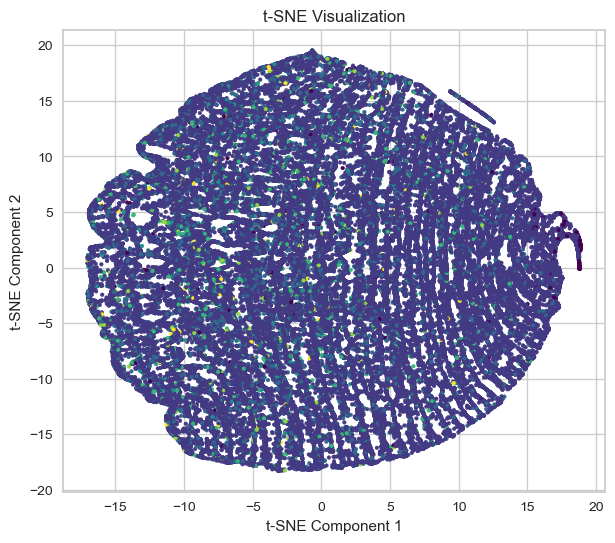

In [18]:
DBscan_rfm['cluster'] = dbscan_pipeline.named_steps['dbscan'].labels_

# Calcul des métriques de silhouette et du coefficient de Davies-Bouldin
silhouette = silhouette_score(DBscan_rfm, DBscan_rfm['cluster'])
davies_bouldin = davies_bouldin_score(DBscan_rfm, DBscan_rfm['cluster'])
    
# Affichage des résultats par cluster
cluster_results = DBscan_rfm.groupby('cluster').agg({
    'Frequency': 'mean',
    'Recency': 'mean',
    'Monetary': ['mean','count']
    }).round(2)

print("Résultats par cluster : \n",cluster_results)

    
print("\nCoefficient de silhouette :", silhouette)
print("Coefficient de Davies-Bouldin :", davies_bouldin)

# afficher le graphique 3D
#create_3d_scatter_plot(DBscan_rfm, ' DBSCAN')

# t-SNE
tsne = TSNE(n_components=2, init='pca',n_iter=300, n_jobs=-1, verbose=1)
X_tsne = tsne.fit_transform(DBscan_rfm)

# Visualize the results
plt.figure(figsize=(7, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=dbscan_pipeline.named_steps['dbscan'].labels_,cmap='viridis',s=7)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Visualization')
plt.show()




En conclusion, après avoir évalué les performances de l'algorithme DBSCAN, nous avons décidé de ne pas l'utiliser pour notre cas. La principale raison est sa lenteur, qui rend son utilisation inefficace sur notre ensemble de données. De plus, nous avons constaté que les clusters formés par DBSCAN sont beaucoup moins précis que ceux obtenus avec l'algorithme KMeans.

Un autre facteur déterminant est le score de Davies-Bouldin, qui est de 14.84 . Ce score est vraiment élevé. Le score de Davies-Bouldin est une mesure de la "similitude" entre les clusters, où une valeur plus faible indique que les clusters sont bien séparés:distance inter cluster élevée et distance intr cluster faible.  Un score de 14.84 suggère que les clusters formés par DBSCAN ne sont pas bien séparés et/ou que les points à l'intérieur des clusters ne sont pas proches les uns des autres.

Pour ces raisons, nous avons décidé de privilégier l'utilisation de l'algorithme KMeans pour notre analyse de clustering.

## ACP sur les features RFM + note + payment_type + state 

In [19]:
categorical = df.select_dtypes(['object']).columns
numerical = df.select_dtypes(['int64','float64']).columns

ohe = OneHotEncoder(sparse_output=False)
ss = StandardScaler()
X_scaled = df.copy()

# Standardisationet encodage
X_scaled[numerical] = ss.fit_transform(X_scaled[numerical])
ohe.fit(X_scaled[categorical])
X_scaled = pd.merge(X_scaled[numerical], pd.DataFrame(columns=ohe.get_feature_names_out().tolist(),
              data=ohe.fit_transform(X_scaled[categorical])).set_index(X_scaled.index),
        left_index=True, right_index=True)

# Display le df scaled
X_scaled.head()

,Frequency,Monetary,note,Recency,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,customer_state_AC,customer_state_AL,...,product_category_security_and_services,product_category_signaling_and_security,product_category_small_appliances,product_category_small_appliances_home_oven_and_coffee,product_category_sports_leisure,product_category_stationery,product_category_tablets_printing_image,product_category_telephony,product_category_toys,product_category_watches_gifts
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.281335,0.022421,0.660788,-0.827702,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.281335,-0.565933,-0.120957,-0.808061,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,-0.281335,-0.300379,-0.902701,1.954817,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,-0.281335,-0.528353,-0.120957,0.540642,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,-0.281335,0.287976,0.660788,0.324588,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [20]:
# Bar plot du pourcentage de variance expliqué par pc 
def plot_scree(var,scree,labels):
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, len(var) + 1), scree, c="red",marker='o')
    plt.bar(x=range(1, len(var) + 1), height=var, tick_label=labels)
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")    


[1.8 1.7 1.6 1.5 0.5 0.4 0.2 0.2 0.1 0.1]


,Frequency,Monetary,note,Recency,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,customer_state_AC,customer_state_AL,...,product_category_security_and_services,product_category_signaling_and_security,product_category_small_appliances,product_category_small_appliances_home_oven_and_coffee,product_category_sports_leisure,product_category_stationery,product_category_tablets_printing_image,product_category_telephony,product_category_toys,product_category_watches_gifts
0,0.71,-0.30,-0.60,0.22,0.01,-0.03,-0.00,0.02,0.0,0.00,...,0.0,0.0,-0.0,-0.0,-0.00,-0.00,0.0,0.00,-0.00,-0.01
1,-0.07,0.84,-0.35,0.41,-0.02,0.03,-0.00,-0.00,0.0,0.00,...,0.0,-0.0,0.0,0.0,-0.00,-0.01,0.0,-0.01,0.00,0.02
2,0.04,0.26,-0.40,-0.88,-0.02,0.02,0.01,-0.00,-0.0,0.00,...,-0.0,0.0,0.0,0.0,-0.01,0.00,-0.0,-0.01,-0.01,0.02
3,0.70,0.37,0.60,-0.13,-0.02,-0.00,-0.00,0.02,0.0,-0.00,...,-0.0,0.0,0.0,0.0,-0.00,-0.00,-0.0,-0.01,-0.00,0.01
4,-0.02,0.05,-0.00,-0.02,0.68,-0.73,0.02,0.02,0.0,-0.00,...,0.0,0.0,0.0,0.0,0.00,-0.00,-0.0,0.00,-0.01,-0.01
5,-0.01,0.03,-0.04,0.04,-0.00,-0.00,0.00,-0.00,-0.0,-0.00,...,-0.0,0.0,0.0,0.0,0.00,-0.00,-0.0,-0.01,-0.00,-0.01
6,-0.00,-0.00,0.02,-0.00,0.01,-0.02,0.00,0.01,-0.0,-0.00,...,-0.0,0.0,0.0,-0.0,-0.00,0.00,0.0,-0.01,0.00,0.01
7,-0.02,0.02,0.01,-0.01,0.01,-0.01,-0.00,0.00,-0.0,-0.01,...,-0.0,-0.0,-0.0,0.0,-0.08,-0.01,-0.0,-0.02,-0.01,-0.01
8,-0.00,0.00,0.00,0.01,0.01,-0.01,0.00,0.00,-0.0,0.00,...,-0.0,-0.0,-0.0,-0.0,-0.38,-0.02,-0.0,-0.05,-0.03,-0.08
9,-0.00,-0.00,0.00,-0.00,-0.00,0.02,-0.00,-0.01,0.0,0.01,...,0.0,0.0,-0.0,0.0,-0.10,-0.00,-0.0,0.03,-0.02,-0.02


,PC,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5
0,PC1,Frequency,Recency,product_category_bed_bath_table,payment_type_voucher,product_category_furniture_decor
1,PC2,Monetary,Recency,payment_type_credit_card,product_category_watches_gifts,customer_state_RJ
2,PC3,Monetary,Frequency,payment_type_credit_card,product_category_watches_gifts,product_category_health_beauty
3,PC4,Frequency,note,Monetary,customer_state_SP,payment_type_voucher
4,PC5,payment_type_boleto,Monetary,payment_type_voucher,product_category_computers_accessories,payment_type_debit_card
5,PC6,customer_state_SP,Recency,Monetary,product_category_bed_bath_table,product_category_housewares
6,PC7,customer_state_RJ,product_category_bed_bath_table,customer_state_SP,note,product_category_watches_gifts
7,PC8,product_category_bed_bath_table,customer_state_MG,customer_state_RJ,customer_state_SP,Monetary
8,PC9,product_category_health_beauty,product_category_bed_bath_table,customer_state_MG,customer_state_RJ,customer_state_SP
9,PC10,customer_state_RS,customer_state_PR,product_category_bed_bath_table,customer_state_SC,customer_state_BA


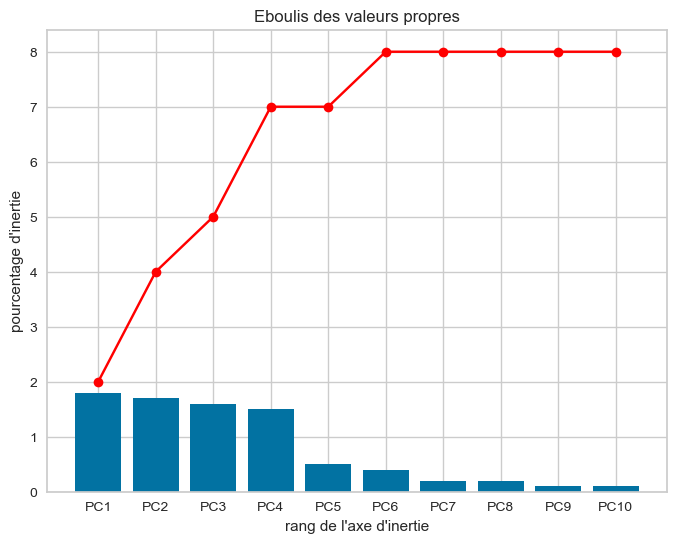

In [21]:
from sklearn import decomposition

# Appliquer l'ACP
pca = decomposition.PCA(random_state=1,n_components=10)
pca.fit(X_scaled) 
pca_data = pca.transform(X_scaled) # génere les coordonées graphique
var = np.round(pca.explained_variance_ratio_* 10, decimals=1)
scree = var.cumsum().round()
labels = ['PC' + str(x) for x in range(1, len(var) + 1)]  
print(var) 
plot_scree(var,scree,labels)

eigenvalues = pca.explained_variance_

n_components = 10
pcs = pca.components_
#print(pcs)
pcs = pd.DataFrame(pca.components_, columns=X_scaled.columns)
# Affichez les composantes principales
display(pcs.round(2))


# Tableau avec les 5 features les plus importants pour chaque composante principale
top_features = pd.DataFrame(columns=['PC', 'Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5'])

for i in range(n_components):
    top_features.loc[i] = [f'PC{i+1}'] + list(pcs.iloc[i].nlargest(5).index)

# Display the table
top_features


In [22]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(7, 7))
  
    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.03,
                head_length=0.03, 
                width=0.001, color='r')
        
        # Texte des labels avec une taille de police plus petite
        plt.text(pca.components_[x, i]+ 0.05 ,
                pca.components_[y, i] + 0.05,
                features[i], fontsize=5)
      
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))


    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display

    plt.axis('equal')
   
    plt.show(block=False)

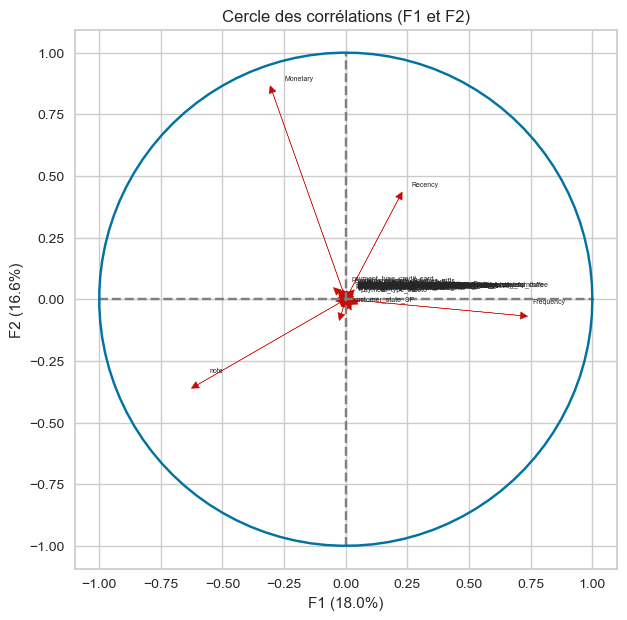

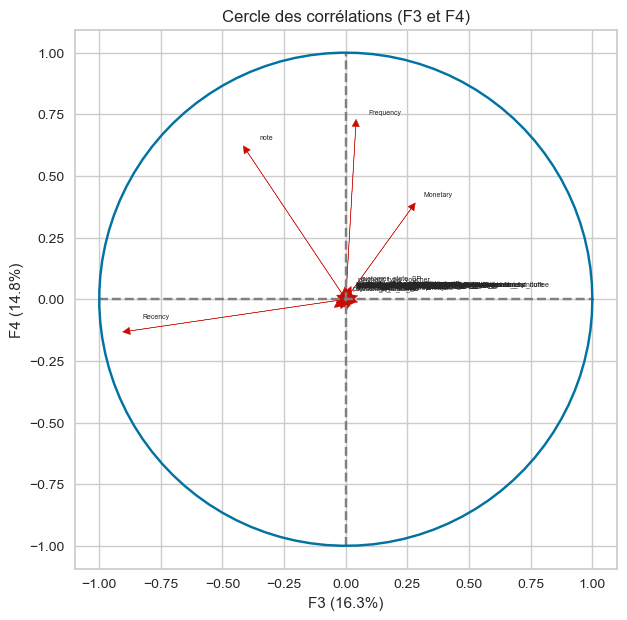

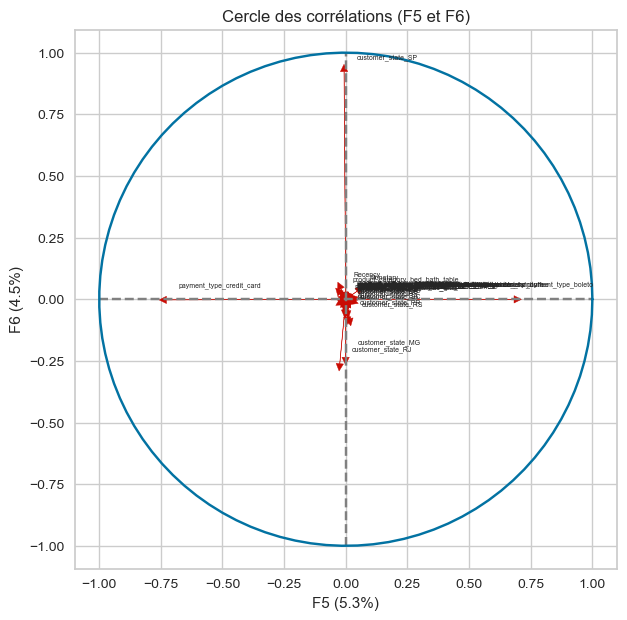

In [23]:
i = 0
while i <= 5:
    correlation_graph(pca, [i,i+1], X_scaled.columns)
    i += 2



In [24]:
def display_factorial_planes(X_projected, x_y, pca=None, labels = None, clusters=None, 
                                alpha=1,
                                figsize=[7,7], 
                                marker="." ):
     
        palette = ["#b2eca7","#ffcc97","#676283","#72bbff","#d2a0f2"]#,"#0abdc0"]

        # Transforme X_projected en np.array
        X_ = np.array(X_projected)

        # On définit la forme de la figure si elle n'a pas été donnée
        if not figsize: 
            figsize = (5,6)

        # On gère les labels
        if  labels is None : 
            labels = []
        try : 
            len(labels)
        except Exception as e : 
            raise e

    # On vérifie la variable axis 
        if not len(x_y) ==2 : 
            raise AttributeError("2 axes sont demandées")   
        if max(x_y )>= X_.shape[1] : 
            raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
        x, y = x_y

    # Initialisation de la figure       
        fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
        c = None if clusters is None else clusters
 
    # Les points    
    #plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, 
     #                    c=c, cmap="Set1", marker=marker)
        sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, palette="RdYlGn_r")

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
        if pca : 
            v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
            v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
        else : 
            v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
        ax.set_xlabel(f'F{x+1} {v1}')
        ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
        x_max = np.abs(X_[:, x]).max() *1.1
        y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
        ax.set_xlim(left=-x_max, right=x_max)
        ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
        plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
        plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
        if len(labels) : 
            for i,(_x,_y) in enumerate(X_[:,[x,y]]):
                plt.text(_x, _y+0.05, labels[i], fontsize='7', ha='center',va='center') 

    # Titre et display
        plt.title(f"Projection des individus (sur F{x+1} et F{y+1})")
        plt.show()


## Kmeans sur le jeu avec les valeurs RFM + notes

In [25]:
# Ajout de la colonne 'note' à X
X = pd.merge(X,df['note'], on='customer_unique_id')
display(X.head())
display(X.shape)

,Frequency,Monetary,Recency,note
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0,4.0
0000f46a3911fa3c0805444483337064,1,69.00,536.0,3.0
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0,4.0
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0,5.0


(91459, 4)

,Frequency,Monetary,Recency,note
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0,4.0
0000f46a3911fa3c0805444483337064,1,69.00,536.0,3.0
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0,4.0
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0,5.0


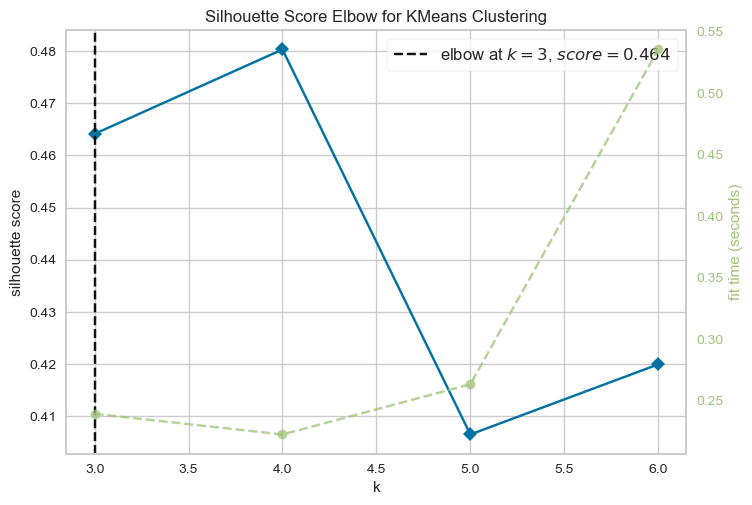

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [26]:
# Determiner le nombre de Cluster optimal
k_rfmn= X.copy()
k_means_pipeline.named_steps['preprocessor'].fit_transform(k_rfmn)
display(k_rfmn[:5])
model = KMeans(init='k-means++', random_state=1, n_init=10)
visualizer = KElbowVisualizer(model, 
                              k=(3,7),
                              metric='silhouette', 
                              timings=True)

visualizer.fit(k_rfmn)
visualizer.poof()


/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



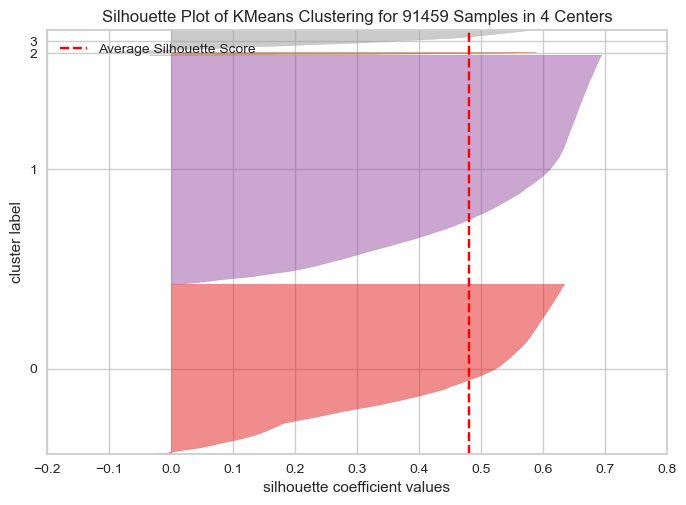

/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



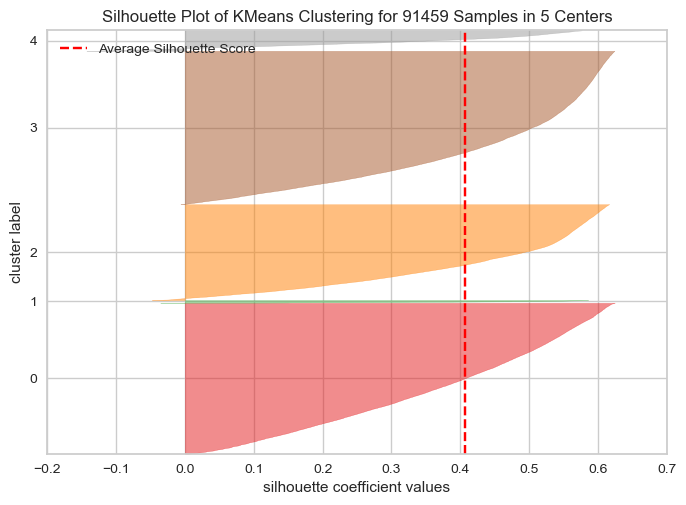

In [27]:
i = 4
while i <= 5:     
    model = KMeans(n_clusters=i, init='k-means++')
    visualizer = SilhouetteVisualizer(model)

    visualizer.fit(k_rfmn)    # Fit the data to the visualizer
    visualizer.poof()    # Draw/show/poof the data
    i += 1

### test kmeans RFM + Note avec 4 cluster

In [28]:
def display_cluster_rfmn_results(X, pipeline):
    # Assignation des clusters aux données
    X['cluster'] = pipeline.named_steps['kmeans'].labels_
    
    # Calcul des métriques de silhouette et du coefficient de Davies-Bouldin
    silhouette = silhouette_score(X, X['cluster'])
    davies_bouldin = davies_bouldin_score(X, X['cluster'])
    
    # Affichage des résultats par cluster
    cluster_results = X.groupby('cluster').agg({
        'Frequency': 'mean',
        'Recency': 'mean',
        'Monetary': 'mean',
        'note': ['mean','count']
    }).round(2)

    print("Résultats par cluster :")
    display(cluster_results)
    
    print("\nCoefficient de silhouette :", silhouette)
    print("Coefficient de Davies-Bouldin :", davies_bouldin)

Résultats par cluster :


Frequency Recency Monetary  note       
             mean    mean     mean  mean  count
cluster                                        
0            1.17  125.63   102.75  4.76  40854
1            1.24  394.63   102.99  4.65  30890
2            1.40  220.70   106.69  1.86  17544
3            1.11  239.57  1033.06  4.28   2171


Coefficient de silhouette : 0.1821793514270951
Coefficient de Davies-Bouldin : 1.7669185446977904
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91459 samples in 0.055s...
[t-SNE] Computed neighbors for 91459 samples in 0.861s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91459
[t-SNE] Computed conditional probabilities for sample 2000 / 91459
[t-SNE] Computed conditional probabilities for sample 3000 / 91459
[t-SNE] Computed conditional probabilities for sample 4000 / 91459
[t-SNE] Computed conditional probabilities for sample 5000 / 91459
[t-SNE] Computed conditional probabilities for sample 6000 / 91459
[t-SNE] Computed conditional probabilities for sample 7000 / 91459
[t-SNE] Computed conditional probabilities for sample 8000 / 91459
[t-SNE] Computed conditional probabilities for sample 9000 / 91459
[t-SNE] Computed conditional probabilities for sample 10000 / 91459
[t-SNE] Computed conditional probabilities for sample 11000 / 91459
[t-SNE] Computed co

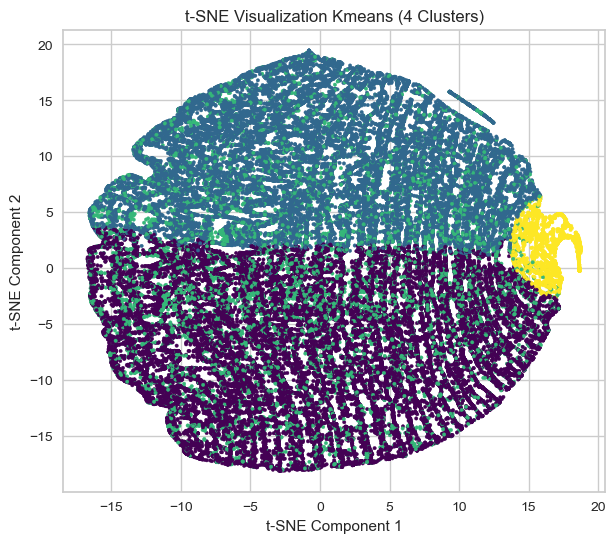

In [29]:
k4_rfmn = X.copy()
k_means_pipeline.named_steps['kmeans'].set_params(init='k-means++',n_clusters=4)
k_means_pipeline.fit_transform(k4_rfmn)
display_cluster_rfmn_results(k4_rfmn, k_means_pipeline)

#create_3d_scatter_plot(k4_rfmn, ' Kmeans (4 Clusters)')
tsne = TSNE(n_components=2, init='pca',n_iter=300, n_jobs=-1, verbose=1)
X_tsne = tsne.fit_transform(k4_rfmn)

# t-SNE
scatter_tsne(X_tsne, ' Kmeans (4 Clusters)')


In [50]:

# Visualisation des clusters
r = k_means_pipeline.named_steps['kmeans'].cluster_centers_
categories = k4_rfmn.columns[:-1]
display(r, categories)

plot_clusters(r, categories)

array([[-1.29039112e-01, -1.20057948e-01, -7.35620893e-01,
         4.75639301e+00,  1.91117864e-01,  7.74409684e-01,
         2.03995218e-02,  1.40729302e-02,  2.49078410e-03,
         2.34133705e-03,  2.93912524e-03,  3.48709774e-04,
         3.11348012e-03,  4.77483312e-02,  2.97399621e-02,
         8.71525356e-02,  6.77493275e-03,  7.72143071e-04,
         4.48341138e-03,  4.98156820e-05,  1.66882535e-03,
         1.02122148e-03,  7.47235230e-05,  7.30297898e-02,
         7.29799741e-03,  1.11836206e-02,  3.91053104e-03,
         2.11716648e-03,  2.73488094e-02,  2.61532330e-03,
         1.64391751e-03,  4.23433297e-04,  4.38378001e-03,
         3.98525456e-04,  3.43479127e-02,  1.49447046e-04,
         1.71615024e-02,  2.49078410e-05,  4.48341138e-04,
         1.46956262e-03,  7.47235230e-05,  6.22696025e-04,
         1.44465478e-03,  4.23433297e-04,  6.99910332e-03,
         2.54059978e-03,  9.21590117e-04,  5.67898775e-02,
         3.51200558e-03,  3.98525456e-04,  2.98395935e-0

Index(['Frequency', 'Monetary', 'Recency', 'note'], dtype='object')

### Test Kmean RFM + Note avec 5 clusters

,Frequency,Monetary,Recency,note
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0,4.0
0000f46a3911fa3c0805444483337064,1,69.00,536.0,3.0
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0,4.0
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0,5.0


Résultats par cluster :


Frequency Recency Monetary  note       
             mean    mean     mean  mean  count
cluster                                        
0            1.15  393.94   103.62  4.66  30410
1            1.23  220.56   107.76  1.87  16967
2            5.41  257.32    84.34  3.68   1769
3            1.08  239.02  1037.64  4.29   2141
4            1.13  125.10   103.14  4.76  40172


Coefficient de silhouette : 0.1600819487378265
Coefficient de Davies-Bouldin : 3.6525269803506197
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91459 samples in 0.060s...
[t-SNE] Computed neighbors for 91459 samples in 0.879s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91459
[t-SNE] Computed conditional probabilities for sample 2000 / 91459
[t-SNE] Computed conditional probabilities for sample 3000 / 91459
[t-SNE] Computed conditional probabilities for sample 4000 / 91459
[t-SNE] Computed conditional probabilities for sample 5000 / 91459
[t-SNE] Computed conditional probabilities for sample 6000 / 91459
[t-SNE] Computed conditional probabilities for sample 7000 / 91459
[t-SNE] Computed conditional probabilities for sample 8000 / 91459
[t-SNE] Computed conditional probabilities for sample 9000 / 91459
[t-SNE] Computed conditional probabilities for sample 10000 / 91459
[t-SNE] Computed conditional probabilities for sample 11000 / 91459
[t-SNE] Computed co

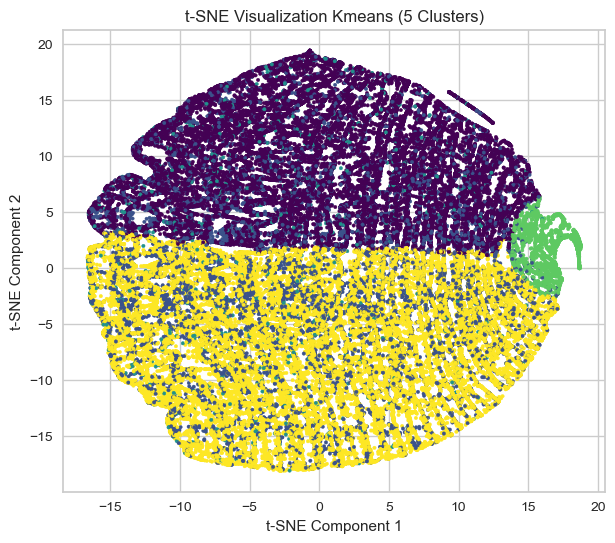

In [30]:
k5_rfmn = X.copy()
k_means_pipeline.named_steps['kmeans'].set_params(init='k-means++', n_clusters=5)
k_means_pipeline.fit_transform(k5_rfmn)
display(k5_rfmn[:5])
display_cluster_rfmn_results(k5_rfmn, k_means_pipeline)


tsne = TSNE(n_components=2, init='pca',n_iter=300, n_jobs=-1, verbose=1)
X_tsne = tsne.fit_transform(k5_rfmn)
scatter_tsne(X_tsne, ' Kmeans (5 Clusters)')

## Kmeans sur le jeu de données avec les valeur RFM+ Note+ moyen de paiement

In [31]:
# Ajout de la colonne 'note' à X
X = pd.merge(X,df['payment_type'], on='customer_unique_id')
display(X.shape)

(91459, 5)

In [32]:
categorical = X.select_dtypes(['object']).columns
numerical = X.select_dtypes(['int64','float64']).columns

ohe = OneHotEncoder(sparse_output=False)
ss = StandardScaler()
X_scaled = df.copy()

# Standardiser les données
ss.fit_transform(X_scaled[numerical])
ohe.fit(X_scaled[categorical])
X_scaled = pd.merge(X_scaled[numerical], pd.DataFrame(columns=ohe.get_feature_names_out().tolist(),
              data=ohe.fit_transform(X_scaled[categorical])).set_index(X_scaled.index),
        left_index=True, right_index=True)



,Frequency,Monetary,Recency,note,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0,5.0,0.0,1.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0,4.0,0.0,1.0,0.0,0.0
0000f46a3911fa3c0805444483337064,1,69.00,536.0,3.0,0.0,1.0,0.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0,4.0,0.0,1.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0,5.0,0.0,1.0,0.0,0.0


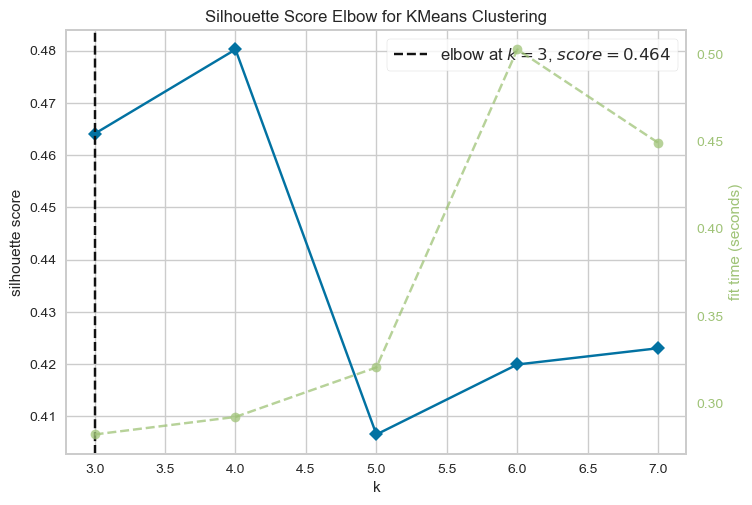

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [33]:
# Determiner le nombre de Cluster optimal
k_5feat= X_scaled.copy()

display(k_5feat[:5])
model = KMeans(init='k-means++', random_state=1, n_init=10)
visualizer = KElbowVisualizer(model, 
                              k=(3,8),
                              metric='silhouette', 
                              timings=True)

visualizer.fit(k_5feat)
visualizer.poof()


In [34]:
'''i = 4
while i <= 6:     
    model = KMeans(n_clusters=i, init='k-means++')
    visualizer = SilhouetteVisualizer(model)

    visualizer.fit(k_5feat)    # Fit the data to the visualizer
    visualizer.poof()    
    i += 1'''

"i = 4\nwhile i <= 6:     \n    model = KMeans(n_clusters=i, init='k-means++')\n    visualizer = SilhouetteVisualizer(model)\n\n    visualizer.fit(k_5feat)    # Fit the data to the visualizer\n    visualizer.poof()    \n    i += 1"

In [35]:
def display_cluster_5feat_results(X, pipeline):
    """
    Display les resultat du clustering.

    Parametres:
    X (DataFrame): Les données d'entrée avec les features et les labels de cluster.
    pipeline (Pipeline): L'objet pipeline contenant le modèle de clustering.

    Retour:
    None
    """
    # Assignation des clusters aux données
    X['cluster'] = pipeline.named_steps['kmeans'].labels_
    
    # Calcul des métriques de silhouette et du coefficient de Davies-Bouldin
    silhouette = silhouette_score(X, X['cluster'])
    davies_bouldin = davies_bouldin_score(X, X['cluster'])
    
    # Affichage des résultats par cluster
    cluster_results = X.groupby('cluster').agg({
        'Frequency': 'mean',
        'Recency': 'mean',
        'Monetary': 'mean',
        'payment_type_credit_card': 'mean',
        'payment_type_boleto': 'mean',
        'note': ['mean','count']
    }).round(2)

    print("Résultats par cluster :")
    display(cluster_results)
    
    print("\nCoefficient de silhouette :", silhouette)
    print("Coefficient de Davies-Bouldin :", davies_bouldin)

In [36]:
k4_5feat = X_scaled.copy()
k_means_pipeline.named_steps['kmeans'].set_params(init='k-means++',n_clusters=4)
k_means_pipeline.fit_transform(k4_5feat)
display_cluster_5feat_results(k4_5feat, k_means_pipeline)

Résultats par cluster :


Frequency Recency Monetary payment_type_credit_card  \
             mean    mean     mean                     mean   
cluster                                                       
0            1.24  394.80   103.24                     0.75   
1            1.17  125.76   102.82                     0.77   
2            1.41  220.69   106.76                     0.76   
3            1.10  238.71  1037.93                     0.84   

        payment_type_boleto  note         
                       mean  mean  count  
cluster                                   
0                      0.22  4.65  30867  
1                      0.19  4.76  40900  
2                      0.20  1.86  17545  
3                      0.14  4.28   2147


Coefficient de silhouette : 0.18184469386257893
Coefficient de Davies-Bouldin : 1.769532670869828


In [49]:

# Visualisation des clusters
r = k_means_pipeline.named_steps['kmeans'].cluster_centers_
categories = k4_5feat.columns[:-1]
display(r, categories)

plot_clusters(r, categories)


array([[-1.29039112e-01, -1.20057948e-01, -7.35620893e-01,
         4.75639301e+00,  1.91117864e-01,  7.74409684e-01,
         2.03995218e-02,  1.40729302e-02,  2.49078410e-03,
         2.34133705e-03,  2.93912524e-03,  3.48709774e-04,
         3.11348012e-03,  4.77483312e-02,  2.97399621e-02,
         8.71525356e-02,  6.77493275e-03,  7.72143071e-04,
         4.48341138e-03,  4.98156820e-05,  1.66882535e-03,
         1.02122148e-03,  7.47235230e-05,  7.30297898e-02,
         7.29799741e-03,  1.11836206e-02,  3.91053104e-03,
         2.11716648e-03,  2.73488094e-02,  2.61532330e-03,
         1.64391751e-03,  4.23433297e-04,  4.38378001e-03,
         3.98525456e-04,  3.43479127e-02,  1.49447046e-04,
         1.71615024e-02,  2.49078410e-05,  4.48341138e-04,
         1.46956262e-03,  7.47235230e-05,  6.22696025e-04,
         1.44465478e-03,  4.23433297e-04,  6.99910332e-03,
         2.54059978e-03,  9.21590117e-04,  5.67898775e-02,
         3.51200558e-03,  3.98525456e-04,  2.98395935e-0

Index(['Frequency', 'Monetary', 'Recency', 'note', 'payment_type_boleto',
       'payment_type_credit_card', 'payment_type_debit_card',
       'payment_type_voucher'],
      dtype='object')

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91459 samples in 0.109s...
[t-SNE] Computed neighbors for 91459 samples in 0.975s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91459
[t-SNE] Computed conditional probabilities for sample 2000 / 91459
[t-SNE] Computed conditional probabilities for sample 3000 / 91459
[t-SNE] Computed conditional probabilities for sample 4000 / 91459
[t-SNE] Computed conditional probabilities for sample 5000 / 91459
[t-SNE] Computed conditional probabilities for sample 6000 / 91459
[t-SNE] Computed conditional probabilities for sample 7000 / 91459
[t-SNE] Computed conditional probabilities for sample 8000 / 91459
[t-SNE] Computed conditional probabilities for sample 9000 / 91459
[t-SNE] Computed conditional probabilities for sample 10000 / 91459
[t-SNE] Computed conditional probabilities for sample 11000 / 91459
[t-SNE] Computed conditional probabilities for sample 12000 / 91459
[t-SNE] Computed conditional probabilities for sam

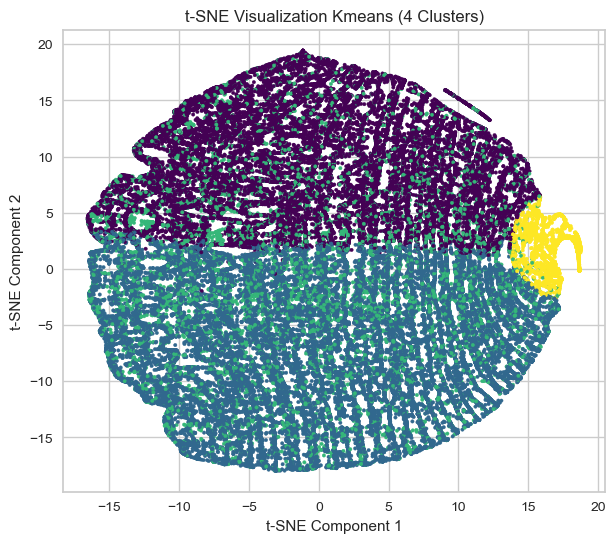

In [37]:
tsne = TSNE(n_components=2, init='pca',n_iter=300, n_jobs=-1, verbose=1)
X_tsne = tsne.fit_transform(k4_5feat)
scatter_tsne(X_tsne, ' Kmeans (4 Clusters)')

In [38]:
k5_5feat = X_scaled.copy()
k_means_pipeline.named_steps['kmeans'].set_params(n_clusters=5)
k_means_pipeline.fit_transform(k5_5feat)

display_cluster_5feat_results(k5_5feat, k_means_pipeline)



Résultats par cluster :


Frequency Recency Monetary payment_type_credit_card  \
             mean    mean     mean                     mean   
cluster                                                       
0            1.15  393.93   103.64                     0.76   
1            1.23  220.57   107.74                     0.77   
2            5.41  257.32    84.34                     0.62   
3            1.13  125.10   103.16                     0.77   
4            1.08  238.66  1038.04                     0.85   

        payment_type_boleto  note         
                       mean  mean  count  
cluster                                   
0                      0.22  4.65  30415  
1                      0.20  1.87  16966  
2                      0.19  3.68   1769  
3                      0.19  4.76  40170  
4                      0.14  4.29   2139


Coefficient de silhouette : 0.15992569889992067
Coefficient de Davies-Bouldin : 3.6533001624555284


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91459 samples in 0.089s...
[t-SNE] Computed neighbors for 91459 samples in 0.889s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91459
[t-SNE] Computed conditional probabilities for sample 2000 / 91459
[t-SNE] Computed conditional probabilities for sample 3000 / 91459
[t-SNE] Computed conditional probabilities for sample 4000 / 91459
[t-SNE] Computed conditional probabilities for sample 5000 / 91459
[t-SNE] Computed conditional probabilities for sample 6000 / 91459
[t-SNE] Computed conditional probabilities for sample 7000 / 91459
[t-SNE] Computed conditional probabilities for sample 8000 / 91459
[t-SNE] Computed conditional probabilities for sample 9000 / 91459
[t-SNE] Computed conditional probabilities for sample 10000 / 91459
[t-SNE] Computed conditional probabilities for sample 11000 / 91459
[t-SNE] Computed conditional probabilities for sample 12000 / 91459
[t-SNE] Computed conditional probabilities for sam

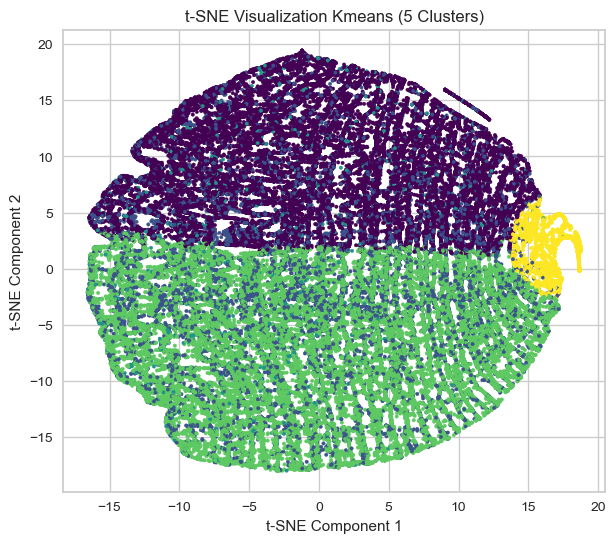

In [39]:

tsne = TSNE(n_components=2, init='pca',n_iter=300, n_jobs=-1, verbose=1)
X_tsne = tsne.fit_transform(k5_5feat)
scatter_tsne(X_tsne, ' Kmeans (5 Clusters)')

## Kmeans sur le jeu de donnée avec RFM + Note+ Moyen de paiment + categorie du produit

In [40]:
X = pd.merge(X,df['product_category'], on='customer_unique_id')
display(X.head())
display(X.shape)

,Frequency,Monetary,Recency,note,payment_type,product_category
customer_unique_id,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0,5.0,credit_card,bed_bath_table
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0,4.0,credit_card,health_beauty
0000f46a3911fa3c0805444483337064,1,69.00,536.0,3.0,credit_card,stationery
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0,4.0,credit_card,telephony
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0,5.0,credit_card,telephony


(91459, 6)

In [41]:
categorical = X.select_dtypes(['object']).columns
numerical = X.select_dtypes(['int64','float64']).columns

ohe = OneHotEncoder(sparse_output=False)
ss = StandardScaler()
X_scaled = df.copy()

# Standardiser les données
ss.fit_transform(X_scaled[numerical])
ohe.fit(X_scaled[categorical])
X_scaled = pd.merge(X_scaled[numerical], pd.DataFrame(columns=ohe.get_feature_names_out().tolist(),
              data=ohe.fit_transform(X_scaled[categorical])).set_index(X_scaled.index),
        left_index=True, right_index=True)

# Display the scaled dataframe
X_scaled.head()

,Frequency,Monetary,Recency,note,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_agro_industry_and_commerce,product_category_air_conditioning,...,product_category_security_and_services,product_category_signaling_and_security,product_category_small_appliances,product_category_small_appliances_home_oven_and_coffee,product_category_sports_leisure,product_category_stationery,product_category_tablets_printing_image,product_category_telephony,product_category_toys,product_category_watches_gifts
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,1,69.00,536.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


,Frequency,Monetary,Recency,note,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_agro_industry_and_commerce,product_category_air_conditioning,...,product_category_security_and_services,product_category_signaling_and_security,product_category_small_appliances,product_category_small_appliances_home_oven_and_coffee,product_category_sports_leisure,product_category_stationery,product_category_tablets_printing_image,product_category_telephony,product_category_toys,product_category_watches_gifts
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,1,69.00,536.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/sklearn/c

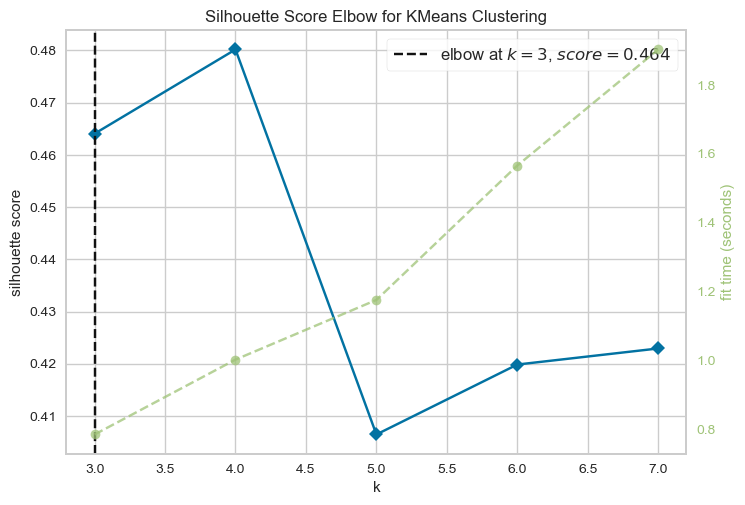

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [42]:
k_6features= X_scaled.copy()
display(k_6features[:5])
model = KMeans(init='k-means++', random_state=1)
visualizer = KElbowVisualizer(model, 
                              k=(3,8),
                              metric='silhouette', 
                              timings=True)

visualizer.fit(k_6features)
visualizer.poof()

In [43]:
'''i = 4
while i <= 6:     
    model = KMeans(n_clusters=i, init='k-means++')
    visualizer = SilhouetteVisualizer(model)

    visualizer.fit(k_6features)    # Fit the data to the visualizer
    visualizer.poof()    # Draw/show/poof the data
    i += 1'''

"i = 4\nwhile i <= 6:     \n    model = KMeans(n_clusters=i, init='k-means++')\n    visualizer = SilhouetteVisualizer(model)\n\n    visualizer.fit(k_6features)    # Fit the data to the visualizer\n    visualizer.poof()    # Draw/show/poof the data\n    i += 1"

In [44]:
def display_cluster_6feat_results(X, pipeline):
    # Assignation des clusters aux données
    X['cluster'] = pipeline.named_steps['kmeans'].labels_
    
    # Calcul des métriques de silhouette et du coefficient de Davies-Bouldin
    silhouette = silhouette_score(X, X['cluster'])
    davies_bouldin = davies_bouldin_score(X, X['cluster'])
    
    # Affichage des résultats par cluster
    cluster_results = X.groupby('cluster').agg({
        'Frequency': 'mean',
        'Recency': 'mean',
        'Monetary': 'mean',
        'payment_type_credit_card': 'mean',
        'payment_type_boleto': 'mean',
        'product_category_agro_industry_and_commerce': 'mean',
        'product_category_air_conditioning': 'mean',
        'product_category_art': 'mean',
        'product_category_audio': 'mean',
        'product_category_auto': 'mean',
        'product_category_baby': 'mean',
        'product_category_bed_bath_table': 'mean',
        'product_category_books_general_interest': 'mean',
        'product_category_books_imported': 'mean',
        'product_category_books_technical': 'mean',
        'product_category_cds_dvds_musicals': 'mean',
        'product_category_christmas_supplies': 'mean',
        'product_category_cine_photo': 'mean',
        'product_category_computers': 'mean',
        'product_category_computers_accessories': 'mean',
        'product_category_consoles_games': 'mean',
        'product_category_construction_tools_construction': 'mean',
        'product_category_construction_tools_lights': 'mean',
        'note': ['mean','count']
    }).round(2)

    print("Résultats par cluster :")
    display(cluster_results)
    
    print("\nCoefficient de silhouette :", silhouette)
    print("Coefficient de Davies-Bouldin :", davies_bouldin)

In [45]:
k4_6feat = X_scaled.copy()
k_means_pipeline.named_steps['kmeans'].set_params(init='k-means++',n_clusters=4)
k_means_pipeline.fit_transform(k4_6feat)
display(k4_6feat[:5])
display_cluster_6feat_results(k4_6feat, k_means_pipeline)

,Frequency,Monetary,Recency,note,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_agro_industry_and_commerce,product_category_air_conditioning,...,product_category_security_and_services,product_category_signaling_and_security,product_category_small_appliances,product_category_small_appliances_home_oven_and_coffee,product_category_sports_leisure,product_category_stationery,product_category_tablets_printing_image,product_category_telephony,product_category_toys,product_category_watches_gifts
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,1,69.00,536.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


Résultats par cluster :


Frequency Recency Monetary payment_type_credit_card  \
             mean    mean     mean                     mean   
cluster                                                       
0            1.24  394.49   102.92                     0.75   
1            1.17  125.54   102.60                     0.77   
2            1.11  239.25  1029.70                     0.84   
3            1.40  220.68   106.73                     0.76   

        payment_type_boleto product_category_agro_industry_and_commerce  \
                       mean                                        mean   
cluster                                                                   
0                      0.22                                        0.00   
1                      0.19                                        0.00   
2                      0.14                                        0.01   
3                      0.20                                        0.00   

        product_category_air_conditioning product_category_art  \
                                     mean                 mean   
cluster                                                          
0                                    0.00                  0.0   
1                                    0.00                  0.0   
2                                    0.01                  0.0   
3                                    0.00                  0.0   

        product_category_audio product_category_auto  ...  \
                          mean                  mean  ...   
cluster                                               ...   
0                         0.00                  0.03  ...   
1                         0.00                  0.05  ...   
2                         0.01                  0.05  ...   
3                         0.01                  0.04  ...   

        product_category_cds_dvds_musicals  \
                                      mean   
cluster                                      
0                                      0.0   
1                                      0.0   
2                                      0.0   
3                                      0.0   

        product_category_christmas_supplies product_category_cine_photo  \
                                       mean                        mean   
cluster                                                                   
0                                       0.0                         0.0   
1                                       0.0                         0.0   
2                                       0.0                         0.0   
3                                       0.0                         0.0   

        product_category_computers product_category_computers_accessories  \
                              mean                                   mean   
cluster                                                                     
0                             0.00                                   0.06   
1                             0.00                                   0.07   
2                             0.07                                   0.05   
3                             0.00                                   0.08   

        product_category_consoles_games  \
                                   mean   
cluster                                   
0                                  0.02   
1                                  0.01   
2                                  0.02   
3                                  0.01   

        product_category_construction_tools_construction  \
                                                    mean   
cluster                                                    
0                                                   0.00   
1                                                   0.01   
2                                                   0.01   
3                                                   0.01   

        product_category_construction


Coefficient de silhouette : 0.1825321306645488
Coefficient de Davies-Bouldin : 1.7659265134281137


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91459 samples in 0.025s...
[t-SNE] Computed neighbors for 91459 samples in 26.977s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91459
[t-SNE] Computed conditional probabilities for sample 2000 / 91459
[t-SNE] Computed conditional probabilities for sample 3000 / 91459
[t-SNE] Computed conditional probabilities for sample 4000 / 91459
[t-SNE] Computed conditional probabilities for sample 5000 / 91459
[t-SNE] Computed conditional probabilities for sample 6000 / 91459
[t-SNE] Computed conditional probabilities for sample 7000 / 91459
[t-SNE] Computed conditional probabilities for sample 8000 / 91459
[t-SNE] Computed conditional probabilities for sample 9000 / 91459
[t-SNE] Computed conditional probabilities for sample 10000 / 91459
[t-SNE] Computed conditional probabilities for sample 11000 / 91459
[t-SNE] Computed conditional probabilities for sample 12000 / 91459
[t-SNE] Computed conditional probabilities for sa

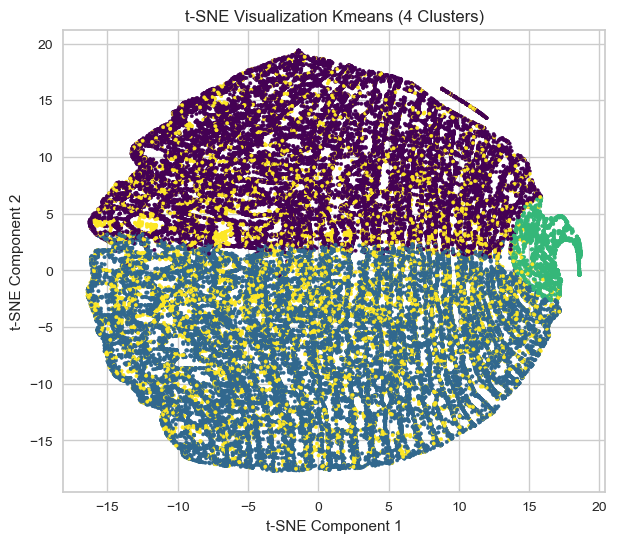

In [46]:
#create_3d_scatter_plot(k4_6feat, ' Kmeans (4 Clusters)')
tsne = TSNE(n_components=2, init='pca',n_iter=300, n_jobs=-1, verbose=1)
X_tsne = tsne.fit_transform(k4_6feat)

# Visualize the results with t-SNE
scatter_tsne(X_tsne, ' Kmeans (4 Clusters)')

In [47]:
k5_6feat = X_scaled.copy()
k_means_pipeline.named_steps['kmeans'].set_params(init='k-means++',n_clusters=5)
k_means_pipeline.fit_transform(k5_6feat)
display(k5_6feat[:5])
display_cluster_6feat_results(k5_6feat, k_means_pipeline)

,Frequency,Monetary,Recency,note,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_agro_industry_and_commerce,product_category_air_conditioning,...,product_category_security_and_services,product_category_signaling_and_security,product_category_small_appliances,product_category_small_appliances_home_oven_and_coffee,product_category_sports_leisure,product_category_stationery,product_category_tablets_printing_image,product_category_telephony,product_category_toys,product_category_watches_gifts
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,111.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,114.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,1,69.00,536.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,1,25.99,320.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,1,180.00,287.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


Résultats par cluster :


Frequency Recency Monetary payment_type_credit_card  \
             mean    mean     mean                     mean   
cluster                                                       
0            1.13  125.06   103.02                     0.77   
1            1.23  220.58   107.72                     0.77   
2            1.15  393.86   103.55                     0.76   
3            5.41  257.32    84.34                     0.62   
4            1.08  238.78  1034.34                     0.85   

        payment_type_boleto product_category_agro_industry_and_commerce  \
                       mean                                        mean   
cluster                                                                   
0                      0.19                                        0.00   
1                      0.20                                        0.00   
2                      0.22                                        0.00   
3                      0.19                                        0.00   
4                      0.13                                        0.01   

        product_category_air_conditioning product_category_art  \
                                     mean                 mean   
cluster                                                          
0                                    0.00                  0.0   
1                                    0.00                  0.0   
2                                    0.00                  0.0   
3                                    0.00                  0.0   
4                                    0.01                  0.0   

        product_category_audio product_category_auto  ...  \
                          mean                  mean  ...   
cluster                                               ...   
0                         0.00                  0.05  ...   
1                         0.01                  0.04  ...   
2                         0.00                  0.03  ...   
3                         0.00                  0.03  ...   
4                         0.01                  0.04  ...   

        product_category_cds_dvds_musicals  \
                                      mean   
cluster                                      
0                                      0.0   
1                                      0.0   
2                                      0.0   
3                                      0.0   
4                                      0.0   

        product_category_christmas_supplies product_category_cine_photo  \
                                       mean                        mean   
cluster                                                                   
0                                       0.0                         0.0   
1                                       0.0                         0.0   
2                                       0.0                         0.0   
3                                       0.0                         0.0   
4                                       0.0                         0.0   

        product_category_computers product_category_computers_accessories  \
                              mean                                   mean   
cluster                                                                     
0                             0.00                                   0.07   
1                             0.00                                   0.08   
2                             0.00                                   0.06   
3                             0.00                                   0.08   
4                             0.07                                   0.04   

        product_category_consoles_games  \
                                   mean   
cluster                                   
0                                  0.01   
1                                  0.01   
2                                  0.02   
3                                  0.00


Coefficient de silhouette : 0.16011008956874584
Coefficient de Davies-Bouldin : 3.6525289176693576


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91459 samples in 0.028s...
[t-SNE] Computed neighbors for 91459 samples in 27.498s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91459
[t-SNE] Computed conditional probabilities for sample 2000 / 91459
[t-SNE] Computed conditional probabilities for sample 3000 / 91459
[t-SNE] Computed conditional probabilities for sample 4000 / 91459
[t-SNE] Computed conditional probabilities for sample 5000 / 91459
[t-SNE] Computed conditional probabilities for sample 6000 / 91459
[t-SNE] Computed conditional probabilities for sample 7000 / 91459
[t-SNE] Computed conditional probabilities for sample 8000 / 91459
[t-SNE] Computed conditional probabilities for sample 9000 / 91459
[t-SNE] Computed conditional probabilities for sample 10000 / 91459
[t-SNE] Computed conditional probabilities for sample 11000 / 91459
[t-SNE] Computed conditional probabilities for sample 12000 / 91459
[t-SNE] Computed conditional probabilities for sa

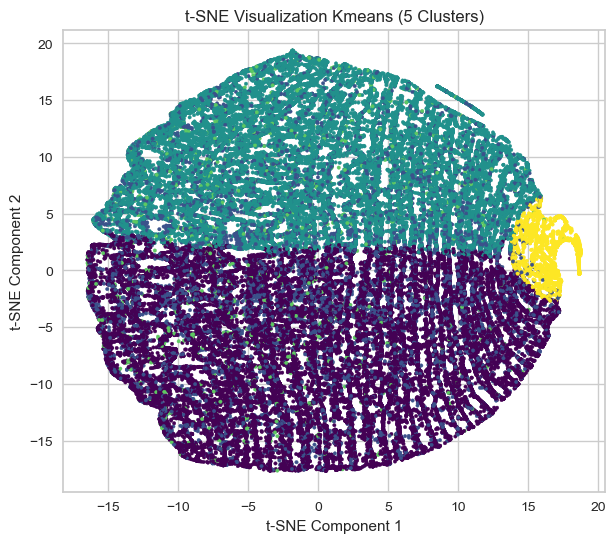

In [48]:
#create_3d_scatter_plot(k5_6feat, ' Kmeans (5 Clusters)')
tsne = TSNE(n_components=2, init='pca',n_iter=300, n_jobs=-1, verbose=1)
X_tsne = tsne.fit_transform(k5_6feat)

# Visualize the results with t-SNE
scatter_tsne(X_tsne, ' Kmeans (5 Clusters)')